In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import random
import numpy as np
from scipy import stats as sp_stats
from tqdm import tqdm
import math
from scipy.stats import entropy
import pandas as pd


#### Specify video path

In [2]:
video_path = 'data/10SOM282.mp4'
cap = cv2.VideoCapture(video_path)
print(os.path.exists(video_path))

True


#### Load the video and visualize the first frame

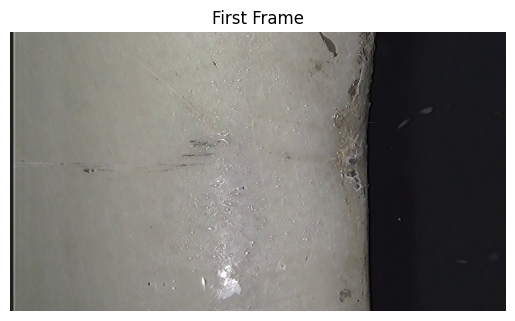

In [10]:
ret, frame = cap.read()
if ret:
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.title("First Frame")
    plt.axis('off')
    plt.show()
else:
    print("Couldn't read the frame.")

#### Print video statistics

In [3]:
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Cannot open video.")
else:
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    duration = frame_count / fps if fps else 0

    print(f"Total frames: {frame_count}")
    print(f"Frames per second (FPS): {fps}")
    print(f"Resolution: {width} x {height}")
    print(f"Duration (seconds): {duration:.2f}")
    
cap.release()

Total frames: 29961
Frames per second (FPS): 29.97002997002997
Resolution: 1920 x 1080
Duration (seconds): 999.70


#### Visualize random frames

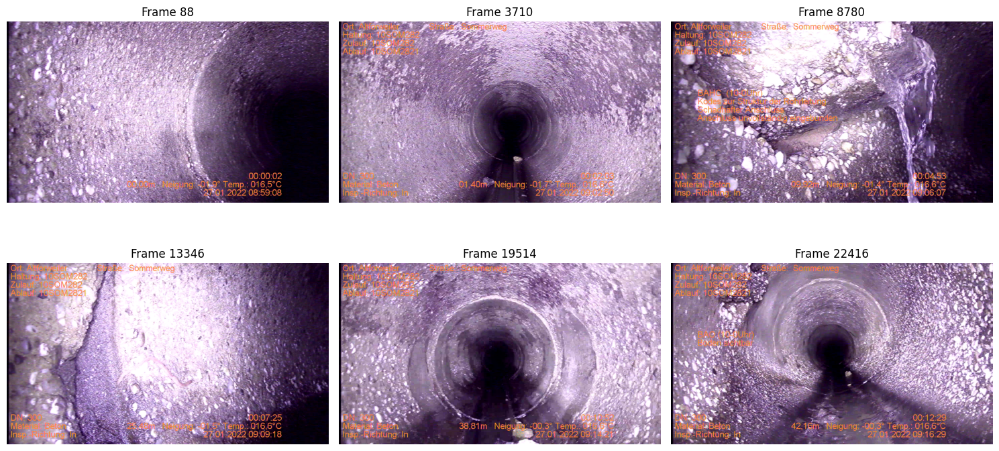

In [15]:
def get_random_frames(video_path, num_frames=5):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    selected_frames = sorted(random.sample(range(total_frames), min(num_frames, total_frames)))

    frames = []
    for i in selected_frames:
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if ret:
            frames.append((i, frame))
    cap.release()
    return frames

def show_frames(frames, figsize=(15, 8)):
    num_frames = len(frames)
    cols = 3  
    rows = math.ceil(num_frames / cols)

    plt.figure(figsize=figsize)

    for idx, (frame_index, frame) in enumerate(frames):
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, idx + 1) 
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_index}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

random_frames = get_random_frames(video_path, num_frames=6)
show_frames(random_frames)


#### Analyze blurriness, sharpness and noise of the selected frames

In [27]:
def analyze_brightness(frames):
    for idx, frame in frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        mean_brightness = np.mean(gray)

        plt.figure(figsize=(6, 3))
        plt.hist(gray.ravel(), bins=256, range=(0, 256), color='gray')
        plt.title(f"Brightness Histogram (Frame {idx})\nMean Brightness: {mean_brightness:.2f}")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Count")
        plt.tight_layout()
        plt.show()

In [28]:
def analyze_blurriness(frames, threshold=100.0):
    for idx, frame in frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

        status = "Blurry" if laplacian_var < threshold else "Sharp"
        print(f"Frame {idx} - Laplacian Variance: {laplacian_var:.2f} ({status})")
        
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame {idx} - {status}")
        plt.axis('off')
        plt.show()


In [29]:
def estimate_noise(frames):
    for idx, frame in frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        lap = cv2.Laplacian(gray, cv2.CV_64F)
        noise_level = lap.std()

        print(f"Frame {idx} - Estimated Noise Level (std of Laplacian): {noise_level:.2f}")
        
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame {idx} - Noise Level: {noise_level:.2f}")
        plt.axis('off')
        plt.show()


#### Run analysis

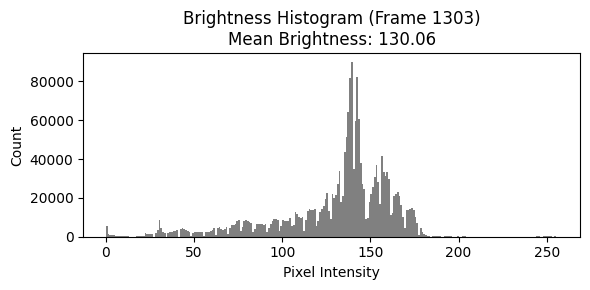

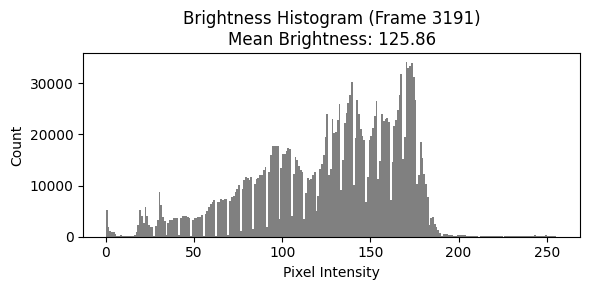

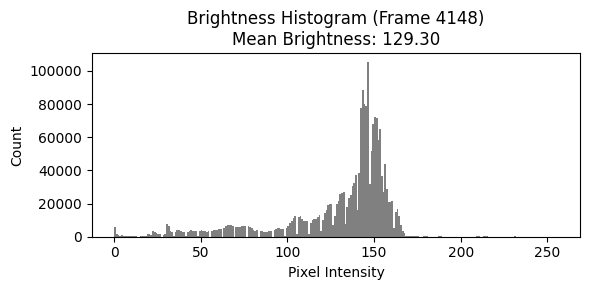

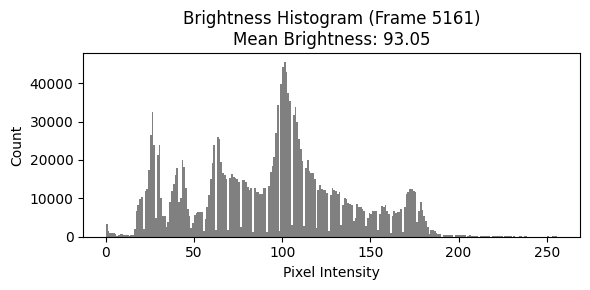

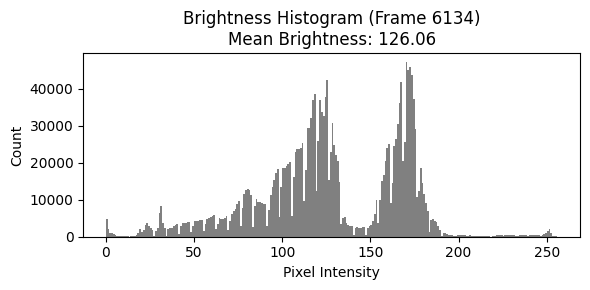

Frame 1303 - Laplacian Variance: 207.14 (Sharp)


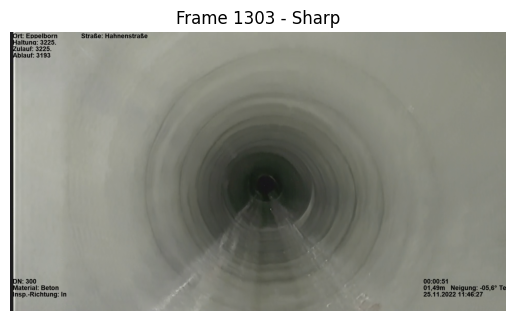

Frame 3191 - Laplacian Variance: 252.85 (Sharp)


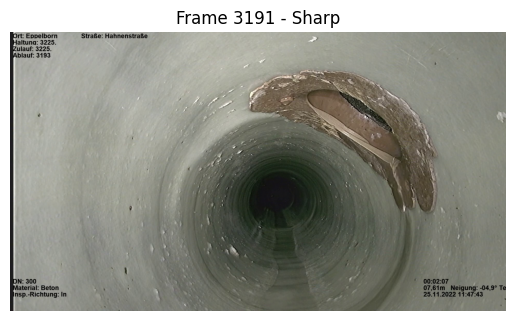

Frame 4148 - Laplacian Variance: 192.98 (Sharp)


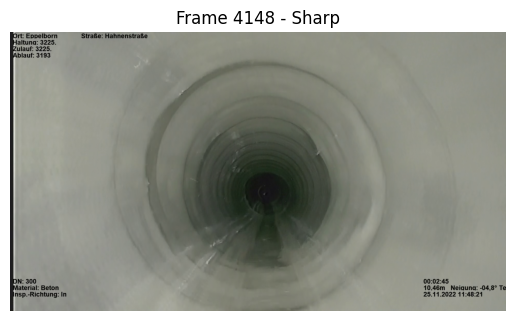

Frame 5161 - Laplacian Variance: 69.00 (Blurry)


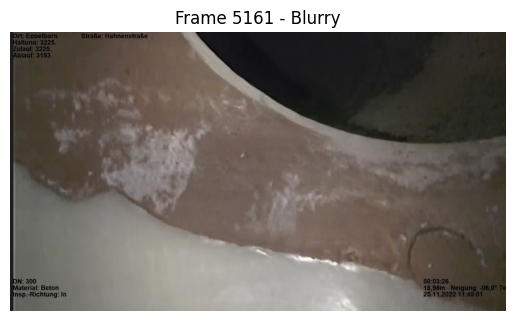

Frame 6134 - Laplacian Variance: 238.29 (Sharp)


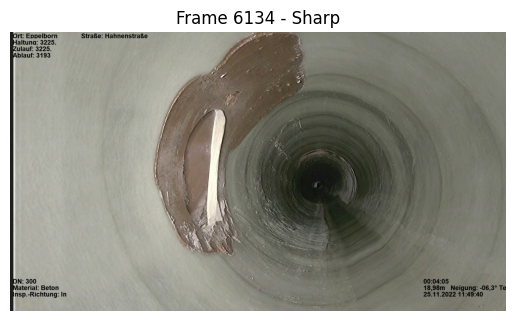

Frame 1303 - Estimated Noise Level (std of Laplacian): 14.39


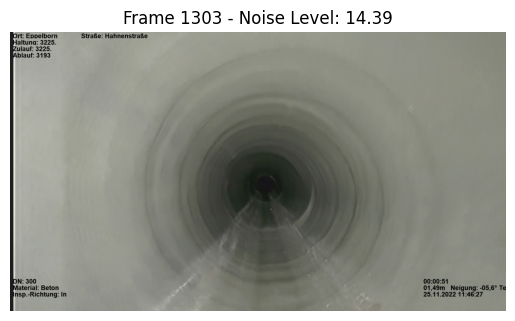

Frame 3191 - Estimated Noise Level (std of Laplacian): 15.90


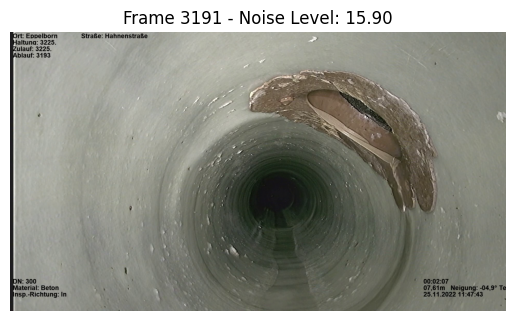

Frame 4148 - Estimated Noise Level (std of Laplacian): 13.89


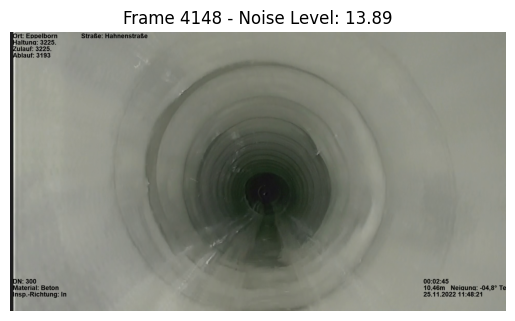

Frame 5161 - Estimated Noise Level (std of Laplacian): 8.31


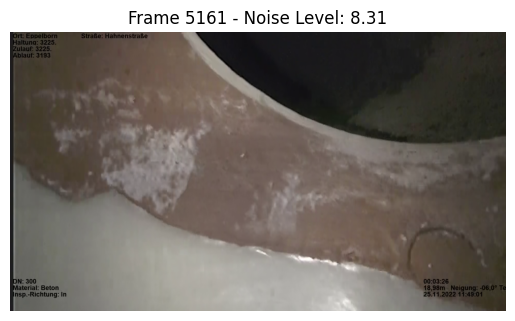

Frame 6134 - Estimated Noise Level (std of Laplacian): 15.44


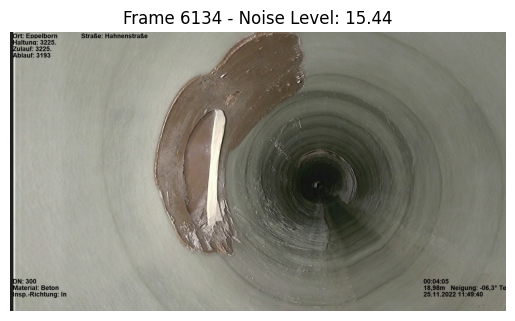

In [32]:
video_path = 'data/3225..mp4'

frames = get_random_frames(video_path, num_frames=5)

analyze_brightness(frames)
analyze_blurriness(frames)
estimate_noise(frames)

#### Analyze the dynamics of brightness, sharpness, offset and motion

In [3]:
def analyze_video_dynamics(video_path):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    motion_energy_list = []
    brightness_list = []
    sharpness_list = []
    center_offset_list = []
    frame_indices = []

    if not cap.isOpened():
        print("Error: Cannot open video.")
        return

    print(f"Analyzing {total_frames} frames...")

    prev_frame = None

    for i in tqdm(range(total_frames)):
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        brightness = np.mean(gray)
        brightness_list.append(brightness)

        sharpness = cv2.Laplacian(gray, cv2.CV_64F).var()
        sharpness_list.append(sharpness)

        h, w = gray.shape
        center_region = gray[h//4:3*h//4, w//4:3*w//4]
        center_offset = np.mean(center_region) - brightness
        center_offset_list.append(center_offset)

        if prev_frame is not None:
            frame_diff = cv2.absdiff(gray, prev_frame)
            motion_energy = np.sum(frame_diff)
        else:
            motion_energy = 0  # No motion energy for the very first frame
        motion_energy_list.append(motion_energy)

        prev_frame = gray

        frame_indices.append(i)

    cap.release()

    return {
        'frame_indices': frame_indices,
        'motion_energy': motion_energy_list,
        'brightness': brightness_list,
        'sharpness': sharpness_list,
        'center_offset': center_offset_list
    }


#### Visualize the dynamics

Analyzing 29961 frames...


100%|█████████▉| 29960/29961 [33:27<00:00, 14.92it/s] 


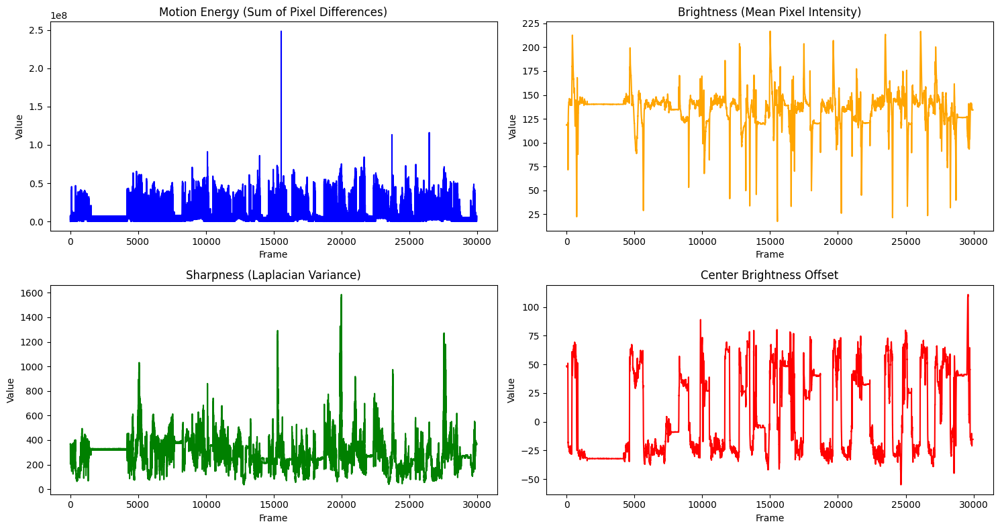

In [4]:
import matplotlib.pyplot as plt

results = analyze_video_dynamics('data/10SOM282.mp4')

fig, axs = plt.subplots(2, 2, figsize=(15, 8))

axs[0, 0].plot(results['frame_indices'], results['motion_energy'], color='blue')
axs[0, 0].set_title('Motion Energy (Sum of Pixel Differences)')

axs[0, 1].plot(results['frame_indices'], results['brightness'], color='orange')
axs[0, 1].set_title('Brightness (Mean Pixel Intensity)')

axs[1, 0].plot(results['frame_indices'], results['sharpness'], color='green')
axs[1, 0].set_title('Sharpness (Laplacian Variance)')

axs[1, 1].plot(results['frame_indices'], results['center_offset'], color='red')
axs[1, 1].set_title('Center Brightness Offset')

for ax in axs.flat:
    ax.set_xlabel('Frame')
    ax.set_ylabel('Value')

plt.tight_layout()
plt.show()


#### Run analysis again o get problematic frames indices

In [19]:
def plot_frame_stats(stats):
    frame_indices = stats['frame_indices']
    
    plt.figure(figsize=(16, 5))
    
    # Brightness
    plt.subplot(1, 3, 1)
    plt.plot(frame_indices, stats['brightness'], label='Brightness', color='orange')
    plt.xlabel("Frame Index")
    plt.ylabel("Mean Brightness")
    plt.title("Brightness Over Time")

    # Blurriness
    plt.subplot(1, 3, 2)
    plt.plot(frame_indices, stats['blur'], label='Blurriness (Laplacian Var)', color='green')
    plt.xlabel("Frame Index")
    plt.ylabel("Blurriness")
    plt.title("Blurriness Over Time")

    # Noise
    plt.subplot(1, 3, 3)
    plt.plot(frame_indices, stats['noise'], label='Noise (Laplacian Std)', color='purple')
    plt.xlabel("Frame Index")
    plt.ylabel("Estimated Noise")
    plt.title("Noise Over Time")

    plt.tight_layout()
    plt.show()


Analyzing 29961 frames...


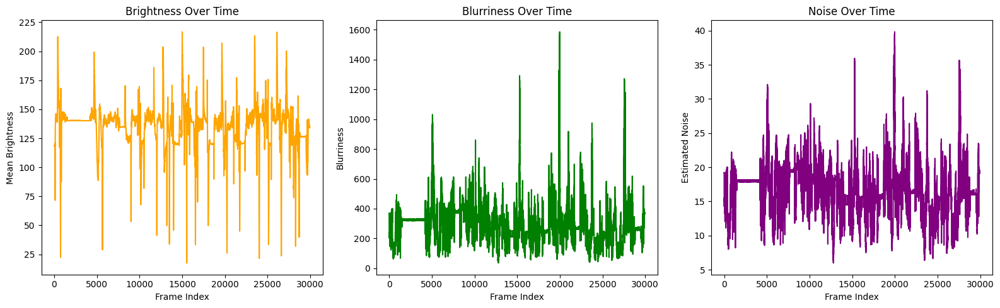

In [20]:
video_path = 'data/10SOM282.mp4'

frame_stats = analyze_video_dynamics(video_path)
plot_frame_stats(frame_stats)

In [27]:
brightness = np.array(frame_stats['brightness'])
frame_indices = np.array(frame_stats['frame_indices'])

sorted_indices = np.argsort(brightness)

top_n = 1

darkest_frames = frame_indices[sorted_indices[:top_n]]

brightest_frames = frame_indices[sorted_indices[-top_n:][::-1]]


#### Show examples of dark and the bright frames

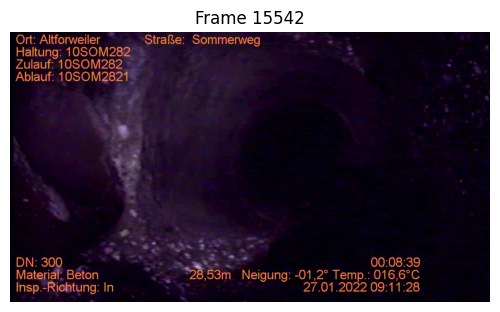

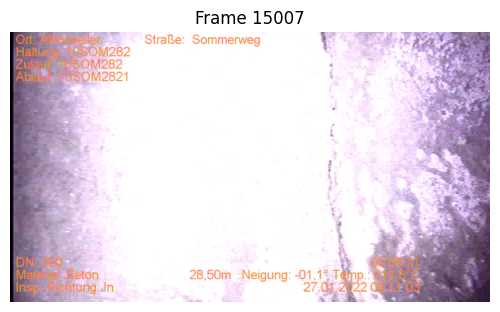

In [29]:
def extract_specific_frames(video_path, frame_numbers):
    cap = cv2.VideoCapture(video_path)
    frames = []
    for i in frame_numbers:
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if ret:
            frames.append((i, frame))
    cap.release()
    return frames

dark_frames = extract_specific_frames(video_path, darkest_frames)
bright_frames = extract_specific_frames(video_path, brightest_frames)

show_frames(dark_frames, figsize=(15, 5))      
show_frames(bright_frames, figsize=(15, 5))    


#### Show the darkest and the brightest frames

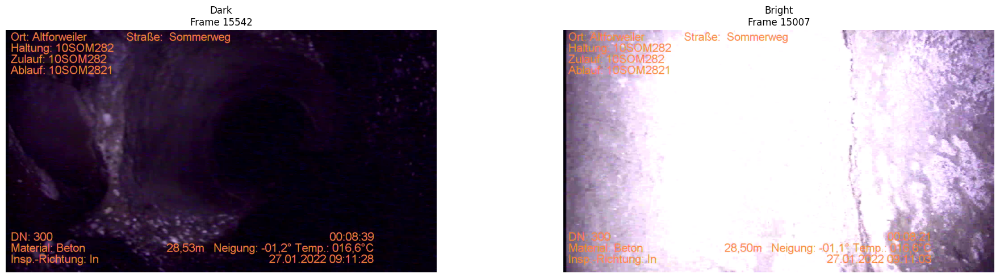

In [30]:
def show_brightest_and_darkest(dark_frames, bright_frames, figsize=(20, 5)):
    total = len(dark_frames) + len(bright_frames)
    plt.figure(figsize=figsize)

    combined = dark_frames + bright_frames  

    for idx, (frame_index, frame) in enumerate(combined):
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.subplot(1, total, idx + 1)
        plt.imshow(frame_rgb)
        label = "Dark" if idx < len(dark_frames) else "Bright"
        plt.title(f"{label}\nFrame {frame_index}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_brightest_and_darkest(dark_frames, bright_frames)


#### Summarize statistics for noise, brightness and blurriness 

In [45]:
def summarize_stats(data, name):
    mean_val = np.mean(data)
    std_val = np.std(data)
    conf_int = sp_stats.t.interval(0.95, len(data)-1, loc=mean_val, scale=sp_stats.sem(data))

    print(f"\n{name.upper()}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Std: {std_val:.2f}")
    print(f"95% Confidence Interval: ({conf_int[0]:.2f}, {conf_int[1]:.2f})")

    return mean_val, std_val, conf_int

In [46]:
brightness_mean, brightness_std, brightness_ci = summarize_stats(frame_stats['brightness'], 'Brightness')
blur_mean, blur_std, blur_ci = summarize_stats(frame_stats['blur'], 'Blur')
noise_mean, noise_std, noise_ci = summarize_stats(frame_stats['noise'], 'Noise')



BRIGHTNESS
Mean: 123.68
Std: 15.80
95% Confidence Interval: (123.36, 124.01)

BLUR
Mean: 421.59
Std: 371.04
95% Confidence Interval: (414.05, 429.13)

NOISE
Mean: 19.21
Std: 7.25
95% Confidence Interval: (19.06, 19.36)


#### Set the threshold for brightness, blurriness and noise values and visualize the frames that are lower and higher than the thresholds

In [48]:
def plot_threshold_examples(video_path, stats, metric_name, threshold, higher_is_better=True, num_examples=3):
    values = stats[metric_name]
    indices = stats['frame_indices']

    passing = []
    failing = []

    for i, val in zip(indices, values):
        if (val >= threshold and higher_is_better) or (val <= threshold and not higher_is_better):
            passing.append(i)
        else:
            failing.append(i)

    cap = cv2.VideoCapture(video_path)

    def get_frames(indices):
        frames = []
        for idx in indices[:num_examples]:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                frames.append((idx, frame_rgb, values[idx]))
        return frames

    print(f"\n--- {metric_name.capitalize()} Check: Threshold = {threshold} ---")
    print(f"Passing frames: {len(passing)}, Failing frames: {len(failing)}")

    fig, axs = plt.subplots(2, num_examples, figsize=(num_examples * 4, 6))

    for i, (idx, frame, val) in enumerate(get_frames(passing)):
        axs[0, i].imshow(frame)
        axs[0, i].set_title(f"PASS - Frame {idx}\n{metric_name}: {val:.2f}")
        axs[0, i].axis('off')

    for i, (idx, frame, val) in enumerate(get_frames(failing)):
        axs[1, i].imshow(frame)
        axs[1, i].set_title(f"FAIL - Frame {idx}\n{metric_name}: {val:.2f}")
        axs[1, i].axis('off')

    axs[0, 0].set_ylabel("PASS")
    axs[1, 0].set_ylabel("FAIL")

    plt.tight_layout()
    plt.show()

    cap.release()



--- Brightness Check: Threshold = 107.88712557848982 ---
Passing frames: 8443, Failing frames: 864


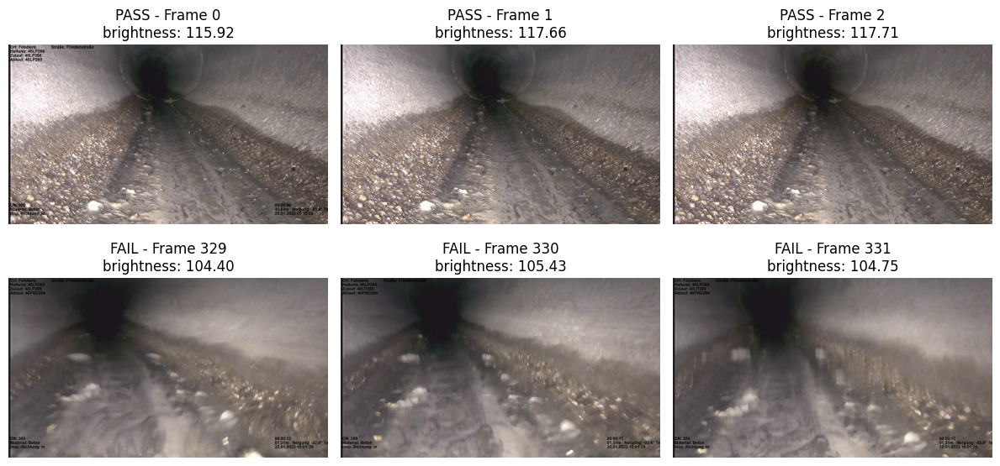


--- Blur Check: Threshold = 100 ---
Passing frames: 8868, Failing frames: 439


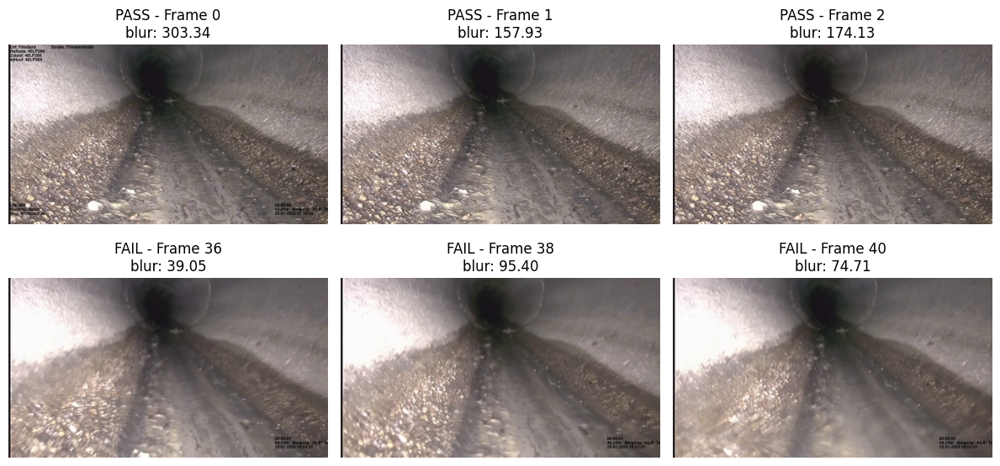


--- Noise Check: Threshold = 26.45861283778383 ---
Passing frames: 8344, Failing frames: 963


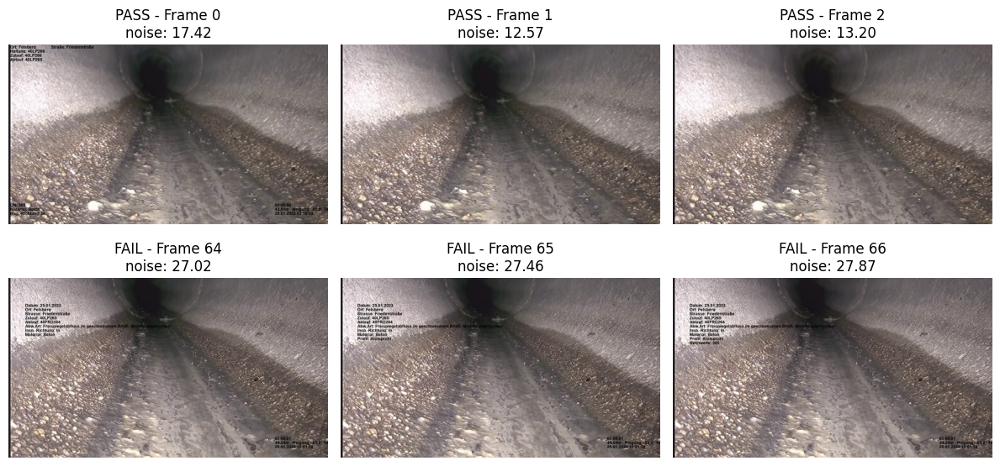

In [49]:
brightness_thresh = brightness_mean - brightness_std  
blur_thresh = 100                                     
noise_thresh = noise_mean + noise_std                 


plot_threshold_examples(video_path, frame_stats, 'brightness', brightness_thresh, higher_is_better=True)
plot_threshold_examples(video_path, frame_stats, 'blur', blur_thresh, higher_is_better=True)
plot_threshold_examples(video_path, frame_stats, 'noise', noise_thresh, higher_is_better=False)



#### Run the final analysis of brightness, blurriness, noise, contrast, sharpness and entropy and calculate the stats

In [4]:
def estimate_noise(gray):
    denoised = cv2.GaussianBlur(gray, (3, 3), 0)
    noise = gray.astype(np.float32) - denoised.astype(np.float32)
    return np.std(noise)

def calculate_entropy(gray):
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256]).flatten()
    hist = hist / hist.sum()
    return entropy(hist + 1e-7, base=2)  # epsilon to avoid log(0)

def count_corners(gray):
    gray_float = np.float32(gray)
    corners = cv2.cornerHarris(gray_float, 2, 3, 0.04)
    return np.sum(corners > 0.01 * corners.max())

def analyze_video_metrics(video_path):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    if not cap.isOpened():
        print("Error: Cannot open video.")
        return None

    print(f"Processing {total_frames} frames...")

    metrics = {
        'sharpness': [],
        'brightness': [],
        'contrast_range': [],
        'contrast_std': [],
        'noise': [],
        'entropy': [],
        'corner_count': []
    }

    for _ in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        metrics['sharpness'].append(cv2.Laplacian(gray, cv2.CV_64F).var())
        metrics['brightness'].append(np.mean(gray))
        metrics['contrast_range'].append(np.max(gray) - np.min(gray))
        metrics['contrast_std'].append(np.std(gray))
        metrics['noise'].append(estimate_noise(gray))
        metrics['entropy'].append(calculate_entropy(gray))
        metrics['corner_count'].append(count_corners(gray))

    cap.release()

    return metrics


In [5]:
def plot_metric_histograms(metrics):
    plt.figure(figsize=(16, 12))
    for i, (key, values) in enumerate(metrics.items(), 1):
        plt.subplot(3, 3, i)
        plt.hist(values, bins=30, color='skyblue', edgecolor='black')
        plt.title(f"{key.replace('_', ' ').capitalize()} (mean={np.mean(values):.2f})")
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.grid(True)
    plt.tight_layout()
    plt.show()


In [6]:
def summarize_metrics(metrics):
    summary = {
        metric: {
            'mean': np.mean(values),
            'std': np.std(values),
            'min': np.min(values),
            'max': np.max(values)
        }
        for metric, values in metrics.items()
    }
    return pd.DataFrame(summary).T


📹 Processing 29961 frames...


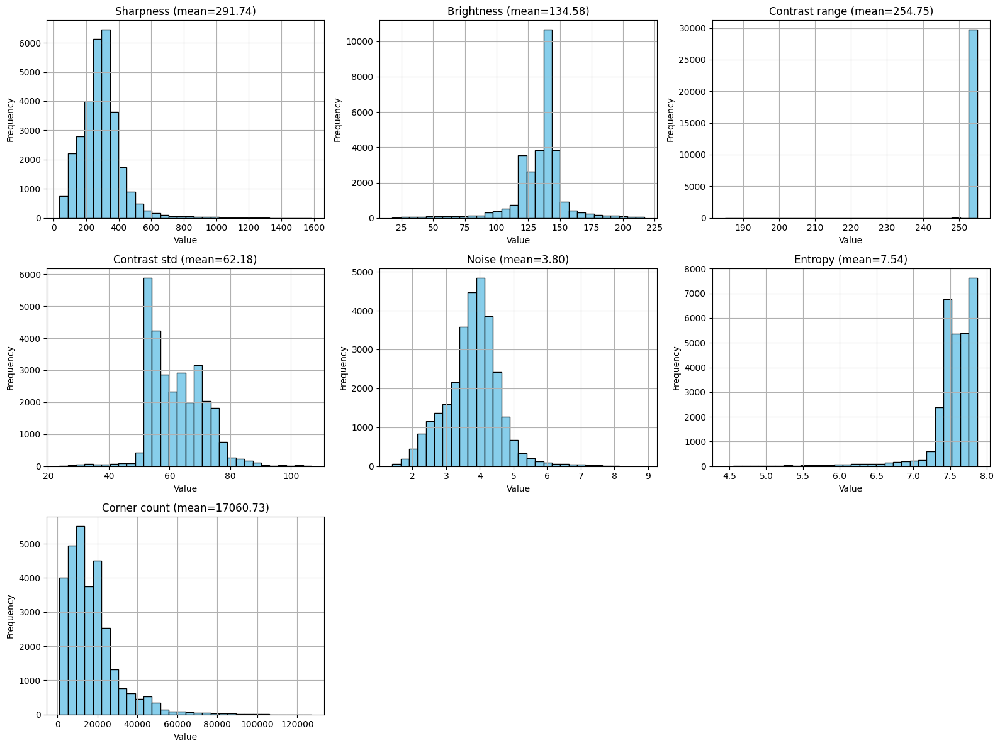

,mean,std,min,max
sharpness,291.738602,127.509496,35.932223,1585.605964
brightness,134.577840,20.617936,17.581503,216.738054
contrast_range,254.745294,3.464638,185.000000,255.000000
contrast_std,62.181966,9.357352,23.724467,106.792502
noise,3.799147,0.798305,1.399511,8.882939
entropy,7.539874,0.342222,4.440194,7.865371
corner_count,17060.728304,12983.068353,1021.000000,127125.000000


In [7]:
video_path = "data/10SOM282.mp4"

metrics = analyze_video_metrics(video_path)
plot_metric_histograms(metrics)
summary_df = summarize_metrics(metrics)

summary_df
